# Case Study - PDAC (DIA and MRM pancreatic ductal adenocarcinoma serum data)

This is case study using the experimental data from [Kim et al. (2024)](https://www.mcponline.org/article/S1535-9476(24)00114-2/fulltext).

In this case study the authors first performed a discovery experiment using DIA.
After this they performed a targeted experiment analyzing a 15 protein subset of 
the DIA experiment using MRM. Here we analyze each dataset in turn and compare 
the variability across acquisition types.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.lines import Line2D
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.collections import LineCollection
from scipy.stats import gaussian_kde

import json
import scipy
import scipy.cluster.hierarchy as sch
import sys
import os
current_dir = os.getcwd()
sys.path.append(os.path.join(os.path.dirname(current_dir), 'code'))
import pickle

import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx

from protmapper import uniprot_client
from indra.databases import hgnc_client

from MSquantSim.simulate import simulate_using_copula, simulate_using_tvae, \
    simulate_using_per_protein
from MSquantSim.downstreamanalysis import run_random_forest
from MSquantSim.similarity_scores import plot_corr, similarity_across_simulations

from causomic.graph_construction.utils import get_neighbor_network
from causomic.graph_construction.indra_queries import get_ids, format_query_results
from sklearn.impute import KNNImputer

import warnings
warnings.filterwarnings('ignore')

import os
from indra_cogex.client import Neo4jClient

client = Neo4jClient(url=os.getenv("API_URL"), 
                        auth=(os.getenv("USER"), 
                            os.getenv("PASSWORD"))
                    )

def hgnc_converter(id, mnemonic_id=False):
    if mnemonic_id:
        uniprot_id = uniprot_client.get_id_from_mnemonic(id)
    else:
        uniprot_id = id
    hgnc_id = uniprot_client.get_hgnc_id(uniprot_id)
    hgnc_name = hgnc_client.get_hgnc_name(hgnc_id)
    return hgnc_name

/home/devon/anaconda3/envs/MSquantSim/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


IPython not installed.


INFO: [2026-01-06 13:51:10] indra_cogex.client.neo4j_client - Connected to neo4j graph at bolt://indra-cogex-lb-b954b684556c373c.elb.us-east-1.amazonaws.com:7687


# DIA
## Process MSstats Protein-Level Data

In [2]:
pdac_dia_input = pd.read_csv('../../data/PDAC_data/dia/PDAC_DIA_protein_level_data.csv')
# Remove proteins which could not be uniquely identified
pdac_dia_input = pdac_dia_input.loc[:, ~pdac_dia_input.columns.str.contains(';', na=False)]

### Convert protein names to gene IDs

In [3]:
keep = ["originalRUN", "GROUP"]

# Convert UniProt to HGNC
orig_cols = list(pdac_dia_input.columns)
new_cols = []
dropped = []

for col in orig_cols:
    if col in keep:
        new_cols.append(col)
    else:
        try:
            new_name = hgnc_converter(col, mnemonic_id=True)
            new_cols.append(new_name)
        except Exception:
            dropped.append(col)

if dropped:
    pdac_dia_input = pdac_dia_input.drop(columns=dropped)

pdac_dia_input.columns = new_cols
pdac_dia_input = pdac_dia_input.drop(columns=[None])
pdac_dia_input.head()

,originalRUN,GROUP,YWHAZ,ORM1,ORM2,SERPINA1,A1BG,SERPINF2,LRG1,A2M,...,FERMT3,VASN,VCAM1,FLT4,VNN1,GC,VTN,VWF,AZGP1,SERPINA10
0,BRI_EXPLORIS-02_DIA_2023-02-13_Pancrea_serum_G...,Cancer,13.720977,22.678027,19.012034,25.865981,21.171464,20.256547,18.750093,24.802330,...,NaN,17.003341,14.227452,14.255811,13.605172,21.543858,21.464663,17.910064,18.854173,17.350070
1,BRI_EXPLORIS-02_DIA_2023-02-13_Pancrea_serum_G...,Cancer,12.942413,22.596331,19.442896,25.342580,20.971118,19.994507,17.474589,24.712653,...,12.166275,16.194895,11.833424,13.801040,13.834975,21.501168,21.330001,17.219232,18.547639,17.284836
2,BRI_EXPLORIS-02_DIA_2023-02-13_Pancrea_serum_G...,Cancer,15.342044,22.437251,18.727350,25.708211,20.880269,19.933185,17.862387,26.217061,...,13.338471,17.033332,13.964083,14.630975,12.193326,21.759486,21.277845,18.390726,17.776644,16.849922
3,BRI_EXPLORIS-02_DIA_2023-02-15_Pancrea_serum_G...,Cancer,14.567717,22.761760,19.171237,25.561015,21.124192,20.016456,17.906203,25.265648,...,12.613046,16.726915,14.351752,14.475815,15.126831,21.964008,21.543723,17.460366,17.961643,17.327577
4,BRI_EXPLORIS-02_DIA_2023-02-15_Pancrea_serum_G...,Cancer,13.897988,22.785164,19.162129,25.408356,21.071123,19.609220,18.801775,24.690819,...,12.440502,16.110067,13.571316,15.178826,14.913476,21.516709,21.250352,18.041408,17.587058,16.979710


### Remove proteins which were missing in majority of runs

In [4]:
# Count missing values per column
missing_counts = pdac_dia_input.isna().sum()
missing_percentages = (missing_counts / len(pdac_dia_input))

print(f"Columns with missing values: {(missing_counts > 0).sum()}")
print(f"Total missing values: {missing_counts.sum()}")

# Remove columns with more than 50% missing values
threshold = 0.5
cols_to_keep = missing_percentages[missing_percentages <= threshold].index
pdac_dia_input = pdac_dia_input[cols_to_keep]

print(f"\nColumns after filtering: {len(pdac_dia_input.columns)}")
print(f"Columns removed: {len(missing_percentages) - len(cols_to_keep)}")

Columns with missing values: 365
Total missing values: 6745

Columns after filtering: 399
Columns removed: 73


### Impute missing data using KNN

In [5]:
# Keep original column order
orig_cols = pdac_dia_input.columns.tolist()

# Split numeric and non-numeric columns
numeric_cols = [c for c in orig_cols if pd.api.types.is_numeric_dtype(pdac_dia_input[c])]
non_numeric_cols = [c for c in orig_cols if c not in numeric_cols]

# Report missing values before imputation
print("Missing values before imputation (numeric cols):")
print(pdac_dia_input[numeric_cols].isna().sum().sum())

# KNN imputation
imputer = KNNImputer(n_neighbors=5, weights="uniform")
imputed_array = imputer.fit_transform(pdac_dia_input[numeric_cols])

# Build imputed DataFrame and restore original column order
imputed_numeric = pd.DataFrame(imputed_array, columns=numeric_cols, index=pdac_dia_input.index)
pdac_dia_input = pd.concat([pdac_dia_input[non_numeric_cols], imputed_numeric], axis=1)[orig_cols]

# Report missing values after imputation
print("\nMissing values after imputation (numeric cols):")
print(pdac_dia_input[numeric_cols].isna().sum().sum())

Missing values before imputation (numeric cols):
2060

Missing values after imputation (numeric cols):
0


### Split for simulation

In [6]:
# Split into health and disease
pdac_dia_input_healthy = pdac_dia_input[pdac_dia_input['GROUP'] == 'Normal'].drop(columns=['originalRUN', 'GROUP'])
pdac_dia_input_disease = pdac_dia_input[pdac_dia_input['GROUP'] == 'Cancer'].drop(columns=['originalRUN', 'GROUP'])

## Simulations
### Copula

#### Single simulation

In [ ]:
copula_sim_pdac_healthy_single = simulate_using_copula(
    pdac_dia_input_healthy, num_simulations=1, 
    samples_per_simulation=len(pdac_dia_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

copula_sim_pdac_disease_single = simulate_using_copula(
    pdac_dia_input_disease, num_simulations=1, 
    samples_per_simulation=len(pdac_dia_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

INFO: [2025-12-20 10:31:32] copulas.multivariate.gaussian - Fitting GaussianMultivariate()
INFO: [2025-12-20 10:32:22] copulas.multivariate.gaussian - Fitting GaussianMultivariate()


#### Multiple simulations

In [ ]:
n_sims = 100

copula_sim_pdac_healthy_multi = simulate_using_copula(
    pdac_dia_input_healthy, num_simulations=n_sims, 
    samples_per_simulation=len(pdac_dia_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=100
)

copula_sim_pdac_disease_multi = simulate_using_copula(
    pdac_dia_input_disease, num_simulations=n_sims, 
    samples_per_simulation=len(pdac_dia_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=100
)

Running copula simulations:   0%|          | 0/100 [00:00<?, ?it/s]

Running copula simulations: 100%|██████████| 100/100 [11:40<00:00,  7.00s/it]


In [ ]:
with open("../../data/PDAC_data/DIA/results/COPULA_PDAC_healthy.pkl", "wb") as f:
    pickle.dump(copula_sim_pdac_healthy_multi, f)
with open("../../data/PDAC_data/DIA/results/COPULA_PDAC_disease.pkl", "wb") as f:
    pickle.dump(copula_sim_pdac_disease_multi, f)

### TVAE

#### Single simulation

In [ ]:
tvae_sim_pdac_healthy_single = simulate_using_tvae(
    pdac_dia_input_healthy, None, num_simulations=1,
    samples_per_simulation=len(pdac_dia_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

tvae_sim_pdac_disease_single = simulate_using_tvae(
    pdac_dia_input_disease, None, num_simulations=1,
    samples_per_simulation=len(pdac_dia_input_disease),
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

INFO: [2025-12-20 11:01:40] sdv.metadata.single_table - Detected metadata:
INFO: [2025-12-20 11:01:40] sdv.metadata.single_table - {
    "columns": {
        "YWHAZ": {
            "sdtype": "numerical"
        },
        "ORM1": {
            "sdtype": "numerical"
        },
        "ORM2": {
            "sdtype": "numerical"
        },
        "SERPINA1": {
            "sdtype": "numerical"
        },
        "A1BG": {
            "sdtype": "numerical"
        },
        "SERPINF2": {
            "sdtype": "numerical"
        },
        "LRG1": {
            "sdtype": "numerical"
        },
        "A2M": {
            "sdtype": "numerical"
        },
        "APP": {
            "sdtype": "numerical"
        },
        "SERPINA3": {
            "sdtype": "numerical"
        },
        "ACTN1": {
            "sdtype": "numerical"
        },
        "ADA2": {
            "sdtype": "numerical"
        },
        "AFM": {
            "sdtype": "numerical"
        },
        "ALB": {
   

#### Multiple simulations

In [ ]:
n_sims = 100

tvae_sim_pdac_healthy_multi = simulate_using_tvae(
    pdac_dia_input_healthy, None, num_simulations=n_sims,
    samples_per_simulation=len(pdac_dia_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

tvae_sim_pdac_disease_multi = simulate_using_tvae(
    pdac_dia_input_disease, None, num_simulations=n_sims,
    samples_per_simulation=len(pdac_dia_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

INFO: [2025-12-20 11:09:17] sdv.metadata.single_table - Detected metadata:
INFO: [2025-12-20 11:09:17] sdv.metadata.single_table - {
    "columns": {
        "YWHAZ": {
            "sdtype": "numerical"
        },
        "ORM1": {
            "sdtype": "numerical"
        },
        "ORM2": {
            "sdtype": "numerical"
        },
        "SERPINA1": {
            "sdtype": "numerical"
        },
        "A1BG": {
            "sdtype": "numerical"
        },
        "SERPINF2": {
            "sdtype": "numerical"
        },
        "LRG1": {
            "sdtype": "numerical"
        },
        "A2M": {
            "sdtype": "numerical"
        },
        "APP": {
            "sdtype": "numerical"
        },
        "SERPINA3": {
            "sdtype": "numerical"
        },
        "ACTN1": {
            "sdtype": "numerical"
        },
        "ADA2": {
            "sdtype": "numerical"
        },
        "AFM": {
            "sdtype": "numerical"
        },
        "ALB": {
   

In [ ]:
with open("../../data/PDAC_data/DIA/results/TVAE_PDAC_healthy.pkl", "wb") as f:
    pickle.dump(tvae_sim_pdac_healthy_multi, f)
with open("../../data/PDAC_data/DIA/results/TVAE_PDAC_disease.pkl", "wb") as f:
    pickle.dump(tvae_sim_pdac_disease_multi, f)

### Per-protein

#### Single simulation

In [ ]:
pprotein_sim_pdac_healthy_single = simulate_using_per_protein(
    pdac_dia_input_healthy, num_simulations=1,
    samples_per_simulation=len(pdac_dia_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

pprotein_sim_pdac_disease_single = simulate_using_per_protein(
    pdac_dia_input_disease, num_simulations=1,
    samples_per_simulation=len(pdac_dia_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

#### Multiple simulations

In [ ]:
pprotein_sim_pdac_healthy_multi = simulate_using_per_protein(
    pdac_dia_input_healthy, num_simulations=100,
    samples_per_simulation=len(pdac_dia_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

pprotein_sim_pdac_disease_multi = simulate_using_per_protein(
    pdac_dia_input_disease, num_simulations=100,
    samples_per_simulation=len(pdac_dia_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

Running per-protein simulations: 100%|██████████| 100/100 [00:00<00:00, 223.73it/s]


In [ ]:
with open("../../data/PDAC_data/DIA/results/PPROTEIN_PDAC_healthy.pkl", "wb") as f:
    pickle.dump(pprotein_sim_pdac_healthy_multi, f)
with open("../../data/PDAC_data/DIA/results/PPROTEIN_PDAC_disease.pkl", "wb") as f:
    pickle.dump(pprotein_sim_pdac_disease_multi, f)

## Evaluate simulations

In [7]:
with open("../../data/PDAC_data/DIA/results/COPULA_PDAC_healthy.pkl", "rb") as f:
    copula_sim_pdac_healthy_multi = pickle.load(f)
with open("../../data/PDAC_data/DIA/results/COPULA_PDAC_disease.pkl", "rb") as f:
    copula_sim_pdac_disease_multi = pickle.load(f)
with open("../../data/PDAC_data/DIA/results/TVAE_PDAC_healthy.pkl", "rb") as f:
    tvae_sim_pdac_healthy_multi = pickle.load(f)
with open("../../data/PDAC_data/DIA/results/TVAE_PDAC_disease.pkl", "rb") as f:
    tvae_sim_pdac_disease_multi = pickle.load(f)
with open("../../data/PDAC_data/DIA/results/PPROTEIN_PDAC_healthy.pkl", "rb") as f:
    pprotein_sim_pdac_healthy_multi = pickle.load(f)
with open("../../data/PDAC_data/DIA/results/PPROTEIN_PDAC_disease.pkl", "rb") as f:
    pprotein_sim_pdac_disease_multi = pickle.load(f)

### Correlation Heatmaps

#### Experimental data

In [ ]:
def plot_corr(
    df: pd.DataFrame,
    size: float = 10,
    method: str = "pearson",
    cmap: str = "RdBu_r",
):
    """
    Professional, label-free correlation heatmap (lower triangle),
    optimized for large feature sets and colorblind safety.
    """
    # Keep numeric columns only
    x = df.select_dtypes(include=[np.number])
    if x.shape[1] < 2:
        raise ValueError("Need at least 2 numeric columns.")

    corr = x.corr(method=method)

    # Mask upper triangle + diagonal
    mask = np.triu(np.ones_like(corr, dtype=bool))
    corr_plot = corr.mask(mask)

    fig, ax = plt.subplots(figsize=(size, size), dpi=150)

    im = ax.imshow(
        corr_plot.to_numpy(),
        vmin=-1,
        vmax=1,
        cmap=cmap,
        interpolation="nearest",
    )

    # Remove all ticks and labels
    ax.set_xticks([])
    ax.set_yticks([])

    # Optional subtle grid for structure (can remove if you want ultra-clean)
    n = corr.shape[0]
    ax.set_xticks(np.arange(-0.5, n, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, n, 1), minor=True)
    ax.grid(which="minor", linewidth=0.4, alpha=.2)
    ax.tick_params(which="minor", bottom=False, left=False)

    # Colorbar
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_ticks([-1, -0.5, 0, 0.5, 1])
    cbar.ax.tick_params(labelsize=10)
    cbar.set_label("Correlation", fontsize=11)

    fig.tight_layout()
    return fig, ax

(<Figure size 750x750 with 2 Axes>, <Axes: >)

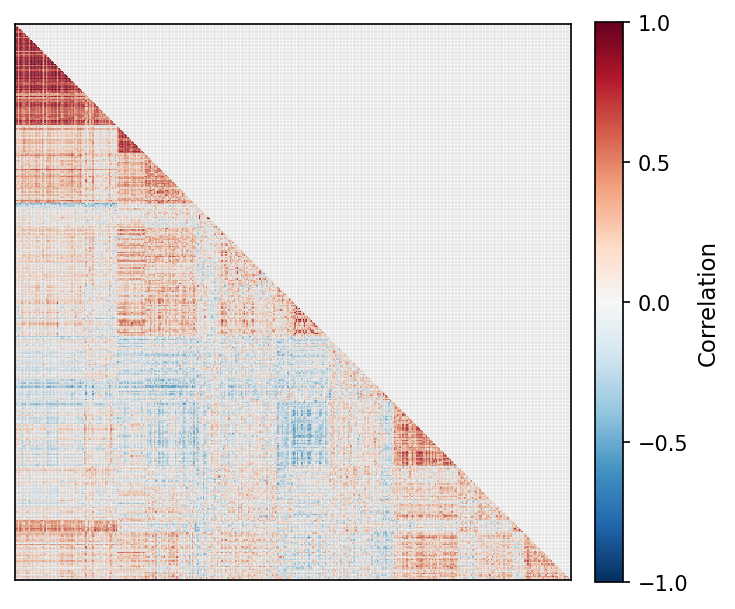

In [74]:
X = pdac_dia_input_healthy.corr().values
X[np.isnan(X)]= 0
d = sch.distance.pdist(X)   
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [pdac_dia_input_healthy.columns.tolist()[i] for i in list((np.argsort(ind)))]
pdac_dia_input_healthy = pdac_dia_input_healthy.reindex(columns, axis=1)
plot_corr(pdac_dia_input_healthy, size =5)

(<Figure size 750x750 with 2 Axes>, <Axes: >)

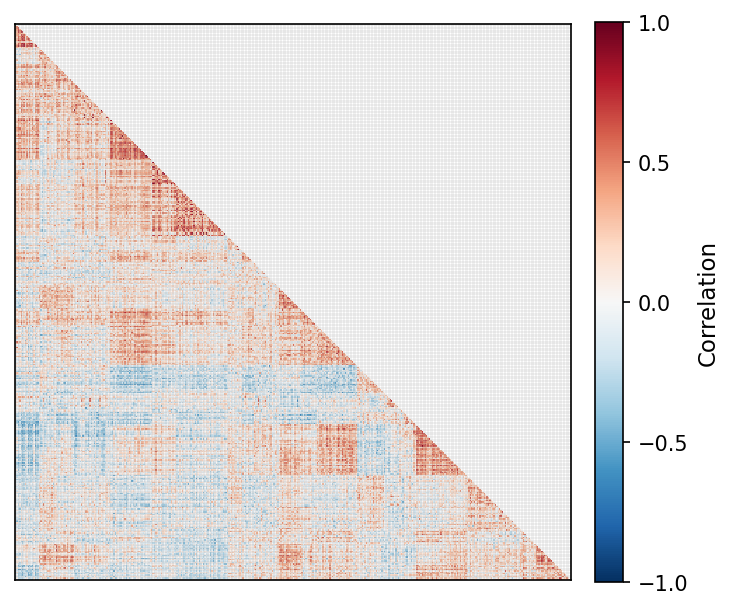

In [75]:
X = pdac_dia_input_disease.corr().values
X[np.isnan(X)]= 0
d = sch.distance.pdist(X)   
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [pdac_dia_input_disease.columns.tolist()[i] for i in list((np.argsort(ind)))]
pdac_dia_input_disease = pdac_dia_input_disease.reindex(columns, axis=1)
plot_corr(pdac_dia_input_disease, size =5)

#### Per-protein

(<Figure size 750x750 with 2 Axes>, <Axes: >)

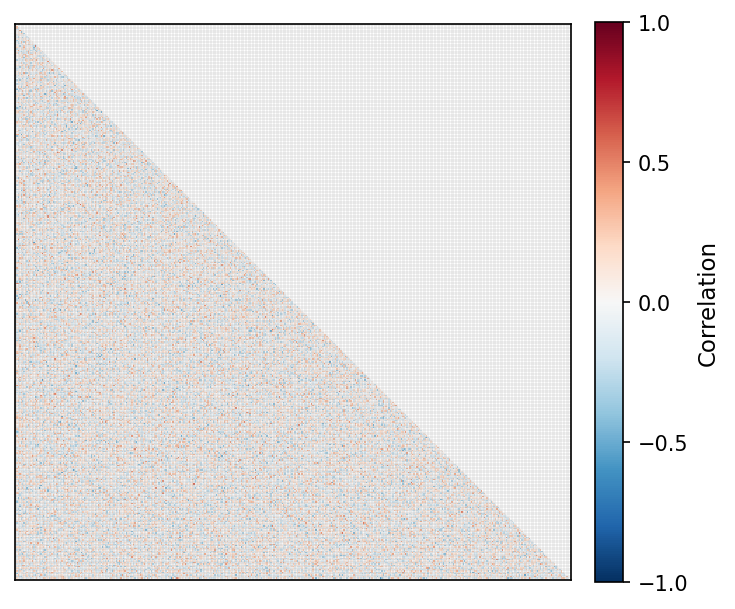

In [76]:
simpp0 = pprotein_sim_pdac_healthy_multi[0]
simpp1 = pprotein_sim_pdac_disease_multi[0]

simpp0 = simpp0.reindex(columns, axis=1)
plot_corr(simpp0, size = 5)

(<Figure size 750x750 with 2 Axes>, <Axes: >)

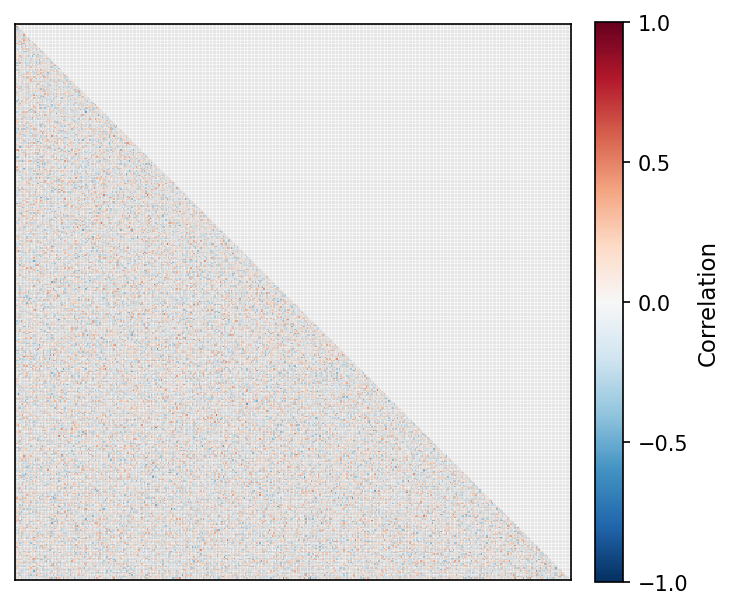

In [ ]:
simpp1 = simpp1.reindex(columns, axis=1)
plot_corr(simpp1, size = 5)

#### VAE

Running tvae simulations:  27%|██▋       | 27/100 [25:29:07<68:54:17, 3398.05s/it]


(<Figure size 750x750 with 2 Axes>, <Axes: >)

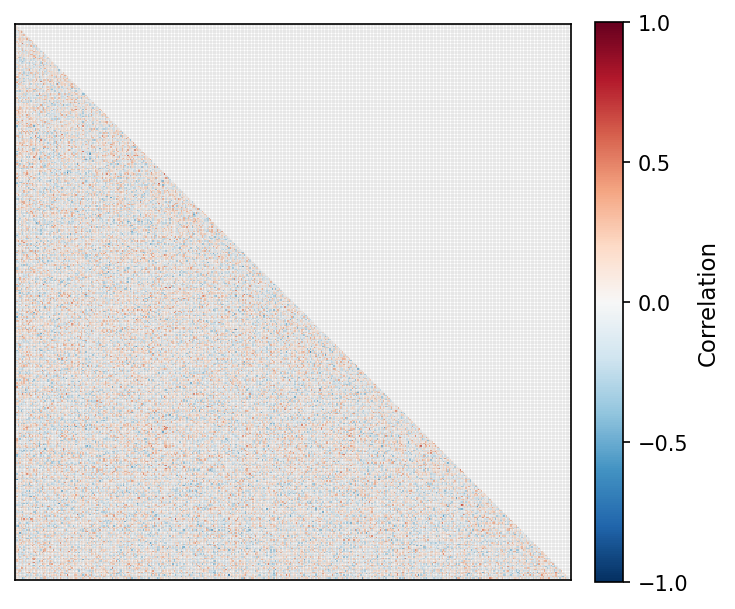

In [77]:
simtvae0 = tvae_sim_pdac_healthy_multi[0]
simtvae1 = tvae_sim_pdac_disease_multi[0]

simtvae0 = simtvae0.reindex(columns, axis=1)
plot_corr(simtvae0, size = 5)

(<Figure size 750x750 with 2 Axes>, <Axes: >)

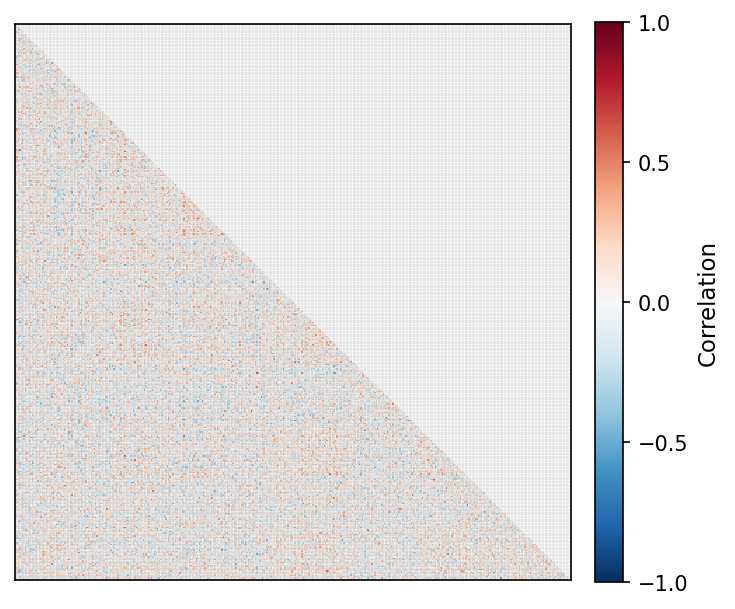

In [ ]:
simtvae1 = simtvae1.reindex(columns, axis=1)
plot_corr(simtvae1, size = 5)

#### Copula

(<Figure size 750x750 with 2 Axes>, <Axes: >)

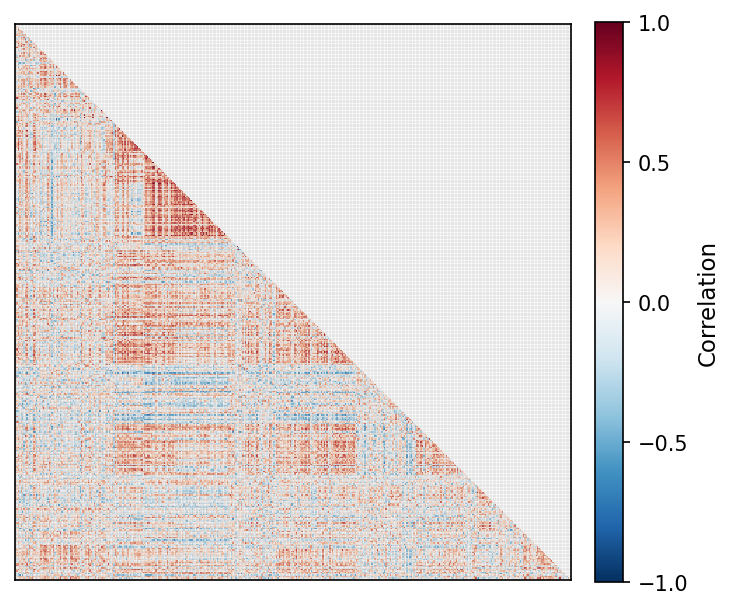

In [78]:
simco0 = copula_sim_pdac_healthy_multi[0]
simco1 = copula_sim_pdac_disease_multi[0]


simco0 = simco0.reindex(columns, axis=1)
plot_corr(simco0, size = 5)

(<Figure size 750x750 with 2 Axes>, <Axes: >)

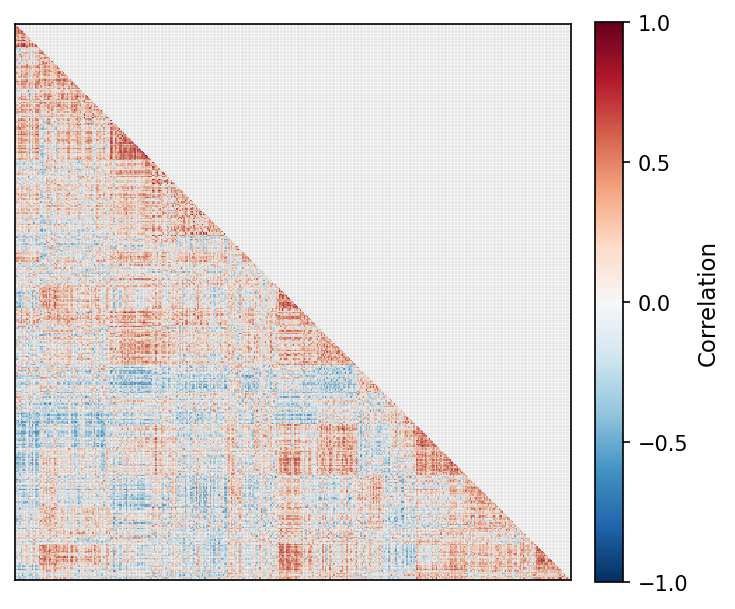

In [80]:
simco1 = simco1.reindex(columns, axis=1)
plot_corr(simco1, size = 5)

## Correlation statistics

In [8]:
pdac_dia_input = pdac_dia_input.drop(columns=['originalRUN'])

### Per-protein

In [9]:
pp_sim_scores = similarity_across_simulations(pprotein_sim_pdac_healthy_multi, 
                                              pprotein_sim_pdac_disease_multi, 
                                              pdac_dia_input, "GROUP", "Normal", "Cancer")

Evaluating simulations:   0%|          | 0/100 [00:00<?, ?it/s]

IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.


/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mean_val, inplace=True)
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace meth

IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.


/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mean_val, inplace=True)
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace meth

IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.


/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:187: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  h.loc[:, condition_column] = condition_label_healthy
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:188: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  d.loc[:, condition_column] = condition_label_disease
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_pape

IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.


/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mean_val, inplace=True)
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace meth

In [10]:
pp_avg_scores = {key: round(np.mean(values),4) for key, values in pp_sim_scores.items()}
print(pp_avg_scores.values())

dict_values([0.9977, 0.1607, 0.949, 0.7975, 0.7262])


In [11]:
pp_avg_scores = {key: round(np.std(values),4) for key, values in pp_sim_scores.items()}
print(pp_avg_scores.values())

dict_values([0.0002, 0.008, 0.0008, 0.0543, 0.0138])


### TVAE

In [12]:
tvae_sim_scores = similarity_across_simulations(tvae_sim_pdac_healthy_multi, 
                                                tvae_sim_pdac_disease_multi, 
                                                pdac_dia_input, "GROUP", "Normal", "Cancer")

Evaluating simulations:   0%|          | 0/100 [00:00<?, ?it/s]/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mean_val, inplace=True)
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace me

IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.


/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mean_val, inplace=True)
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace meth

In [13]:
tvae_avg_scores = {key: round(np.mean(values),4) for key, values in tvae_sim_scores.items()}
print(tvae_avg_scores.values())

dict_values([0.9843, 0.3488, 0.9493, 0.82, 0.7756])


In [14]:
tvae_avg_scores = {key: round(np.std(values),4) for key, values in tvae_sim_scores.items()}
print(tvae_avg_scores.values())

dict_values([0.0007, 0.0195, 0.0018, 0.05, 0.0137])


### Copula

In [15]:
copula_sim_scores = similarity_across_simulations(copula_sim_pdac_healthy_multi, 
                                                  copula_sim_pdac_disease_multi, 
                                                  pdac_dia_input, "GROUP", "Normal", "Cancer")

Evaluating simulations:   0%|          | 0/100 [00:00<?, ?it/s]/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mean_val, inplace=True)
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace me

In [16]:
copula_avg_scores = {key: round(np.mean(values),4) for key, values in copula_sim_scores.items()}
print(copula_avg_scores.values())

dict_values([0.9907, 0.794, 0.9537, 0.765, 0.8758])


In [17]:
copula_avg_scores = {key: round(np.std(values),4) for key, values in copula_sim_scores.items()}
print(copula_avg_scores.values())

dict_values([0.0019, 0.0118, 0.0038, 0.0575, 0.0141])


# MRM
## Process MSstats Protein-Level Data

In [18]:
pdac_mrm_input = pd.read_csv('../../data/PDAC_data/MRM/PDAC_MRM_protein_level_data.csv')
pdac_mrm_input.head()

,originalRUN,GROUP,ANPEP,APOA4,APOC3,C9,CRP,HGFAC,IGFBP2,ITIH3,LRG1,ORM1,PFN1,PIGR,PON3,SERPINA3,VWF
0,PC_092,Cancer,17.609804,22.932694,20.844543,21.868888,12.809162,18.129036,16.656216,21.327547,14.882559,22.540963,17.451308,19.184593,14.799060,23.054676,16.719290
1,PC_168,Cancer,15.307967,24.747555,23.052404,21.951272,13.274623,19.900789,15.570384,20.610561,13.878547,23.384084,17.845162,18.091750,15.604541,23.288847,16.804773
2,PC_180,Cancer,14.824129,23.780698,21.368211,21.431627,13.470326,19.496448,13.453160,21.455086,14.406445,22.486922,18.258667,16.550491,15.285278,23.093575,16.463111
3,PC_184,Cancer,15.428902,23.071761,21.480899,21.051913,13.159770,19.561567,13.698600,20.528751,14.884947,22.319877,18.209270,16.422534,15.417537,23.035198,15.606018
4,PC_192,Cancer,15.043882,23.876208,20.985391,22.371628,14.429354,19.278232,16.264604,21.417230,13.803319,23.328512,18.220354,16.999240,15.367538,23.089819,16.749216


### Remove proteins which were missing in majority of runs

In [19]:
# Count missing values per column
missing_counts = pdac_mrm_input.isna().sum()
missing_percentages = (missing_counts / len(pdac_mrm_input))

print(f"Columns with missing values: {(missing_counts > 0).sum()}")
print(f"Total missing values: {missing_counts.sum()}")

# Remove columns with more than 50% missing values
threshold = 0.5
cols_to_keep = missing_percentages[missing_percentages <= threshold].index
pdac_mrm_input = pdac_mrm_input[cols_to_keep]

print(f"\nColumns after filtering: {len(pdac_mrm_input.columns)}")
print(f"Columns removed: {len(missing_percentages) - len(cols_to_keep)}")

Columns with missing values: 3
Total missing values: 60

Columns after filtering: 17
Columns removed: 0


### Impute missing data using KNN

In [20]:
# Keep original column order
orig_cols = pdac_mrm_input.columns.tolist()

# Split numeric and non-numeric columns
numeric_cols = [c for c in orig_cols if pd.api.types.is_numeric_dtype(pdac_mrm_input[c])]
non_numeric_cols = [c for c in orig_cols if c not in numeric_cols]

# Report missing values before imputation
print("Missing values before imputation (numeric cols):")
print(pdac_mrm_input[numeric_cols].isna().sum().sum())

# KNN imputation
imputer = KNNImputer(n_neighbors=5, weights="uniform")
imputed_array = imputer.fit_transform(pdac_mrm_input[numeric_cols])
# Build imputed DataFrame and restore original column order
imputed_numeric = pd.DataFrame(imputed_array, columns=numeric_cols, index=pdac_mrm_input.index)
pdac_mrm_input = pd.concat([pdac_mrm_input[non_numeric_cols], imputed_numeric], axis=1)[orig_cols]

# Report missing values after imputation
print("\nMissing values after imputation (numeric cols):")
print(pdac_mrm_input[numeric_cols].isna().sum().sum())

Missing values before imputation (numeric cols):
60

Missing values after imputation (numeric cols):
0


### Split for simulation

In [21]:
# Split into health and disease
pdac_mrm_input_healthy = pdac_mrm_input[pdac_mrm_input['GROUP'] == 'Normal'].drop(columns=['originalRUN', 'GROUP'])
pdac_mrm_input_disease = pdac_mrm_input[pdac_mrm_input['GROUP'] == 'Cancer'].drop(columns=['originalRUN', 'GROUP'])

## Simulations
### Copula

#### Single simulation

In [39]:
copula_sim_pdac_mrm_healthy_single = simulate_using_copula(
    pdac_mrm_input_healthy, num_simulations=1, 
    samples_per_simulation=len(pdac_mrm_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

copula_sim_pdac_mrm_disease_single = simulate_using_copula(
    pdac_mrm_input_disease, num_simulations=1, 
    samples_per_simulation=len(pdac_mrm_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

INFO: [2025-12-21 09:17:52] copulas.multivariate.gaussian - Fitting GaussianMultivariate()
INFO: [2025-12-21 09:17:56] copulas.multivariate.gaussian - Fitting GaussianMultivariate()


#### Multiple simulations

In [40]:
n_sims = 100

copula_sim_pdac_mrm_healthy_multi = simulate_using_copula(
    pdac_mrm_input_healthy, num_simulations=n_sims, 
    samples_per_simulation=len(pdac_mrm_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=100
)

copula_sim_pdac_mrm_disease_multi = simulate_using_copula(
    pdac_mrm_input_disease, num_simulations=n_sims, 
    samples_per_simulation=len(pdac_mrm_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=100
)

Running copula simulations: 100%|██████████| 100/100 [00:38<00:00,  2.60it/s]


In [41]:
with open("../../data/PDAC_data/MRM/results/COPULA_PDAC_healthy.pkl", "wb") as f:
    pickle.dump(copula_sim_pdac_mrm_healthy_multi, f)
with open("../../data/PDAC_data/MRM/results/COPULA_PDAC_disease.pkl", "wb") as f:
    pickle.dump(copula_sim_pdac_mrm_disease_multi, f)

### TVAE

#### Single simulation

In [42]:
tvae_sim_pdac_mrm_healthy_single = simulate_using_tvae(
    pdac_mrm_input_healthy, None, num_simulations=1,
    samples_per_simulation=len(pdac_mrm_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

tvae_sim_pdac_mrm_disease_single = simulate_using_tvae(
    pdac_mrm_input_disease, None, num_simulations=1,
    samples_per_simulation=len(pdac_mrm_input_disease),
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

INFO: [2025-12-21 09:20:44] sdv.metadata.single_table - Detected metadata:
INFO: [2025-12-21 09:20:44] sdv.metadata.single_table - {
    "columns": {
        "ANPEP": {
            "sdtype": "numerical"
        },
        "APOA4": {
            "sdtype": "numerical"
        },
        "APOC3": {
            "sdtype": "numerical"
        },
        "C9": {
            "sdtype": "numerical"
        },
        "CRP": {
            "sdtype": "numerical"
        },
        "HGFAC": {
            "sdtype": "numerical"
        },
        "IGFBP2": {
            "sdtype": "numerical"
        },
        "ITIH3": {
            "sdtype": "numerical"
        },
        "LRG1": {
            "sdtype": "numerical"
        },
        "ORM1": {
            "sdtype": "numerical"
        },
        "PFN1": {
            "sdtype": "numerical"
        },
        "PIGR": {
            "sdtype": "numerical"
        },
        "PON3": {
            "sdtype": "numerical"
        },
        "SERPINA3": {
     

#### Multiple simulations

In [44]:
n_sims = 100

tvae_sim_pdac_mrm_healthy_multi = simulate_using_tvae(
    pdac_mrm_input_healthy, None, num_simulations=n_sims,
    samples_per_simulation=len(pdac_mrm_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

tvae_sim_pdac_mrm_disease_multi = simulate_using_tvae(
    pdac_mrm_input_disease, None, num_simulations=n_sims,
    samples_per_simulation=len(pdac_mrm_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

INFO: [2025-12-21 09:22:43] sdv.metadata.single_table - Detected metadata:
INFO: [2025-12-21 09:22:43] sdv.metadata.single_table - {
    "columns": {
        "ANPEP": {
            "sdtype": "numerical"
        },
        "APOA4": {
            "sdtype": "numerical"
        },
        "APOC3": {
            "sdtype": "numerical"
        },
        "C9": {
            "sdtype": "numerical"
        },
        "CRP": {
            "sdtype": "numerical"
        },
        "HGFAC": {
            "sdtype": "numerical"
        },
        "IGFBP2": {
            "sdtype": "numerical"
        },
        "ITIH3": {
            "sdtype": "numerical"
        },
        "LRG1": {
            "sdtype": "numerical"
        },
        "ORM1": {
            "sdtype": "numerical"
        },
        "PFN1": {
            "sdtype": "numerical"
        },
        "PIGR": {
            "sdtype": "numerical"
        },
        "PON3": {
            "sdtype": "numerical"
        },
        "SERPINA3": {
     

In [45]:
with open("../../data/PDAC_data/MRM/results/TVAE_PDAC_healthy.pkl", "wb") as f:
    pickle.dump(tvae_sim_pdac_mrm_healthy_multi, f)
with open("../../data/PDAC_data/MRM/results/TVAE_PDAC_disease.pkl", "wb") as f:
    pickle.dump(tvae_sim_pdac_mrm_disease_multi, f)

### Per-protein

#### Single simulation

In [49]:
pprotein_sim_pdac_mrm_healthy_single = simulate_using_per_protein(
    pdac_mrm_input_healthy, num_simulations=1,
    samples_per_simulation=len(pdac_mrm_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

pprotein_sim_pdac_mrm_disease_single = simulate_using_per_protein(
    pdac_mrm_input_disease, num_simulations=1,
    samples_per_simulation=len(pdac_mrm_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

#### Multiple simulations

In [50]:
pprotein_sim_pdac_mrm_healthy_multi = simulate_using_per_protein(
    pdac_mrm_input_healthy, num_simulations=100,
    samples_per_simulation=len(pdac_mrm_input_healthy), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

pprotein_sim_pdac_mrm_disease_multi = simulate_using_per_protein(
    pdac_mrm_input_disease, num_simulations=100,
    samples_per_simulation=len(pdac_mrm_input_disease), # Set to size of input data to mirror variability
    output_dir=None, output_prefix='simulated',
    return_data=True, random_state=2
)

Running per-protein simulations: 100%|██████████| 100/100 [00:00<00:00, 2165.77it/s]


In [48]:
with open("../../data/PDAC_data/MRM/results/PPROTEIN_PDAC_healthy.pkl", "wb") as f:
    pickle.dump(pprotein_sim_pdac_mrm_healthy_multi, f)
with open("../../data/PDAC_data/MRM/results/PPROTEIN_PDAC_disease.pkl", "wb") as f:
    pickle.dump(pprotein_sim_pdac_mrm_disease_multi, f)

## Evaluate simulations

In [22]:
with open("../../data/PDAC_data/MRM/results/COPULA_PDAC_healthy.pkl", "rb") as f:
    copula_sim_pdac_mrm_healthy_multi = pickle.load(f)
with open("../../data/PDAC_data/MRM/results/COPULA_PDAC_disease.pkl", "rb") as f:
    copula_sim_pdac_mrm_disease_multi = pickle.load(f)
with open("../../data/PDAC_data/MRM/results/TVAE_PDAC_healthy.pkl", "rb") as f:
    tvae_sim_pdac_mrm_healthy_multi = pickle.load(f)
with open("../../data/PDAC_data/MRM/results/TVAE_PDAC_disease.pkl", "rb") as f:
    tvae_sim_pdac_mrm_disease_multi = pickle.load(f)
with open("../../data/PDAC_data/MRM/results/PPROTEIN_PDAC_healthy.pkl", "rb") as f:
    pprotein_sim_pdac_mrm_healthy_multi = pickle.load(f)
with open("../../data/PDAC_data/MRM/results/PPROTEIN_PDAC_disease.pkl", "rb") as f:
    pprotein_sim_pdac_mrm_disease_multi = pickle.load(f)

### Correlation Heatmaps

#### Experimental data

In [86]:
def plot_corr(
    df: pd.DataFrame,
    size: float = 10,
    method: str = "pearson",
    cmap: str = "RdBu_r",
):
    """
    Professional, label-free correlation heatmap (lower triangle),
    optimized for large feature sets and colorblind safety.
    """
    # Keep numeric columns only
    x = df.select_dtypes(include=[np.number])
    if x.shape[1] < 2:
        raise ValueError("Need at least 2 numeric columns.")

    corr = x.corr(method=method)

    # Mask upper triangle + diagonal
    mask = np.triu(np.ones_like(corr, dtype=bool))
    corr_plot = corr.mask(mask)

    fig, ax = plt.subplots(figsize=(size, size), dpi=150)

    im = ax.imshow(
        corr_plot.to_numpy(),
        vmin=-1,
        vmax=1,
        cmap=cmap,
        interpolation="nearest",
    )

    # Remove all ticks and labels
    ax.set_xticks([])
    ax.set_yticks([])

    # Optional subtle grid for structure (can remove if you want ultra-clean)
    n = corr.shape[0]
    ax.set_xticks(np.arange(-0.5, n, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, n, 1), minor=True)
    ax.grid(which="minor", linewidth=0.4, alpha=.2)
    ax.tick_params(which="minor", bottom=False, left=False)

    # Colorbar
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_ticks([-1, -0.5, 0, 0.5, 1])
    cbar.ax.tick_params(labelsize=10)
    cbar.set_label("Correlation", fontsize=11)

    fig.tight_layout()
    return fig, ax

In [87]:
pdac_mrm_input.head()

,originalRUN,GROUP,ANPEP,APOA4,APOC3,C9,CRP,HGFAC,IGFBP2,ITIH3,LRG1,ORM1,PFN1,PIGR,PON3,SERPINA3,VWF
0,PC_092,Cancer,17.609804,22.932694,20.844543,21.868888,12.809162,18.129036,16.656216,21.327547,14.882559,22.540963,17.451308,19.184593,14.799060,23.054676,16.719290
1,PC_168,Cancer,15.307967,24.747555,23.052404,21.951272,13.274623,19.900789,15.570384,20.610561,13.878547,23.384084,17.845162,18.091750,15.604541,23.288847,16.804773
2,PC_180,Cancer,14.824129,23.780698,21.368211,21.431627,13.470326,19.496448,13.453160,21.455086,14.406445,22.486922,18.258667,16.550491,15.285278,23.093575,16.463111
3,PC_184,Cancer,15.428902,23.071761,21.480899,21.051913,13.159770,19.561567,13.698600,20.528751,14.884947,22.319877,18.209270,16.422534,15.417537,23.035198,15.606018
4,PC_192,Cancer,15.043882,23.876208,20.985391,22.371628,14.429354,19.278232,16.264604,21.417230,13.803319,23.328512,18.220354,16.999240,15.367538,23.089819,16.749216


(<Figure size 750x750 with 2 Axes>, <Axes: >)

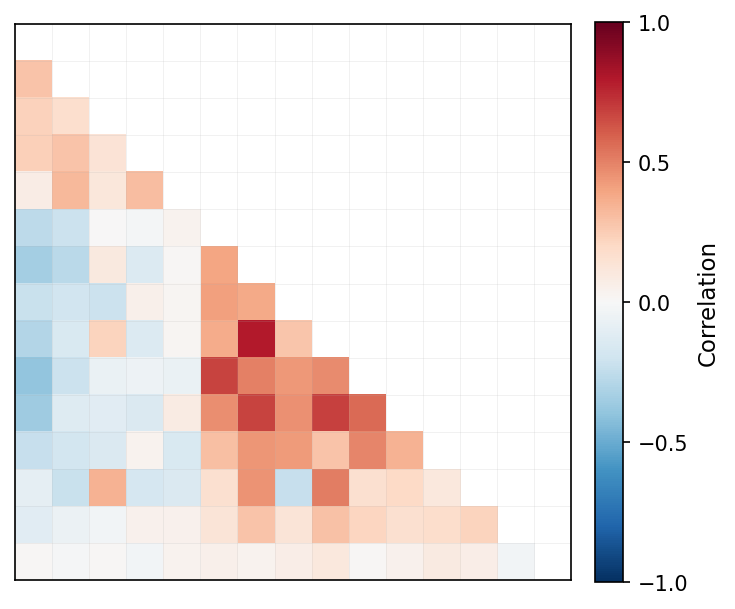

In [88]:
X = pdac_mrm_input_healthy.corr().values
X[np.isnan(X)]= 0
d = sch.distance.pdist(X)   
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [pdac_mrm_input_healthy.columns.tolist()[i] for i in list((np.argsort(ind)))]
pdac_mrm_input_healthy = pdac_mrm_input_healthy.reindex(columns, axis=1)
plot_corr(pdac_mrm_input_healthy, size =5)

(<Figure size 750x750 with 2 Axes>, <Axes: >)

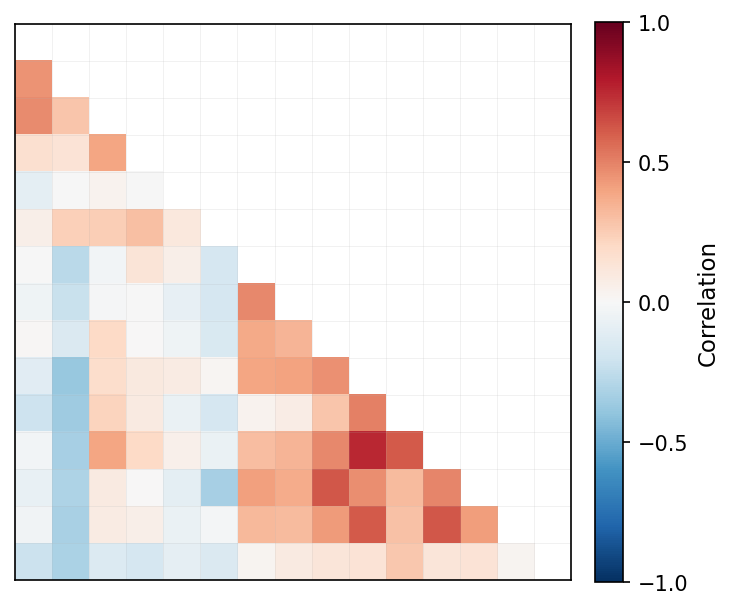

In [89]:
X = pdac_mrm_input_disease.corr().values
X[np.isnan(X)]= 0
d = sch.distance.pdist(X)   
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [pdac_mrm_input_disease.columns.tolist()[i] for i in list((np.argsort(ind)))]
pdac_mrm_input_disease = pdac_mrm_input_disease.reindex(columns, axis=1)
plot_corr(pdac_mrm_input_disease, size =5)

#### Per-protein

(<Figure size 750x750 with 2 Axes>, <Axes: >)

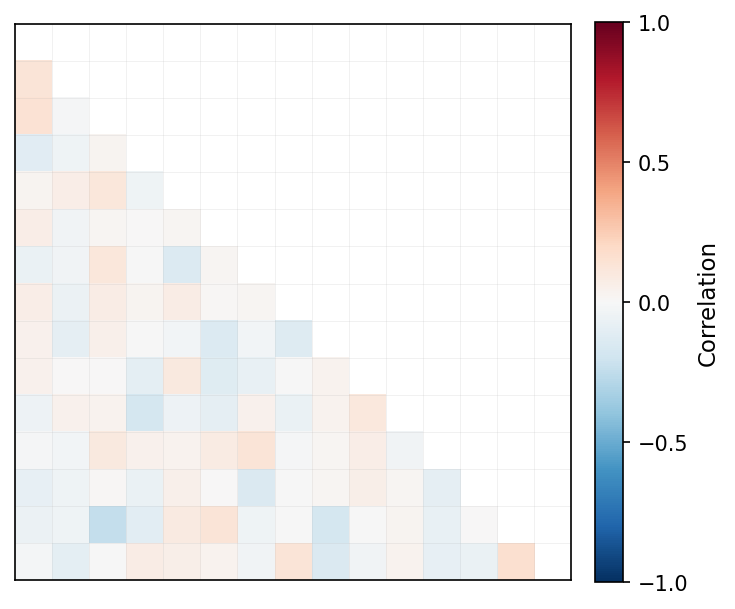

In [90]:
simpp0 = pprotein_sim_pdac_mrm_healthy_multi[0]
simpp1 = pprotein_sim_pdac_mrm_disease_multi[0]

simpp0 = simpp0.reindex(columns, axis=1)
plot_corr(simpp0, size = 5)

(<Figure size 750x750 with 2 Axes>, <Axes: >)

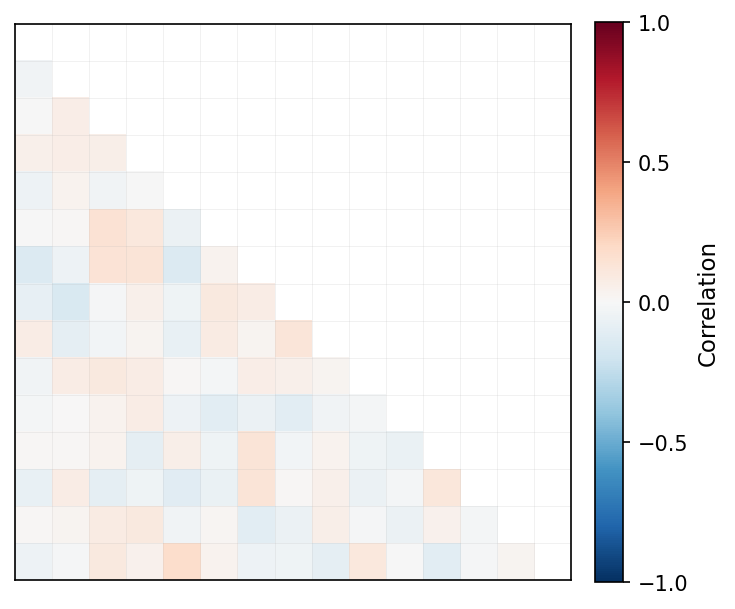

In [91]:
simpp1 = simpp1.reindex(columns, axis=1)
plot_corr(simpp1, size = 5)

#### VAE

(<Figure size 750x750 with 2 Axes>, <Axes: >)

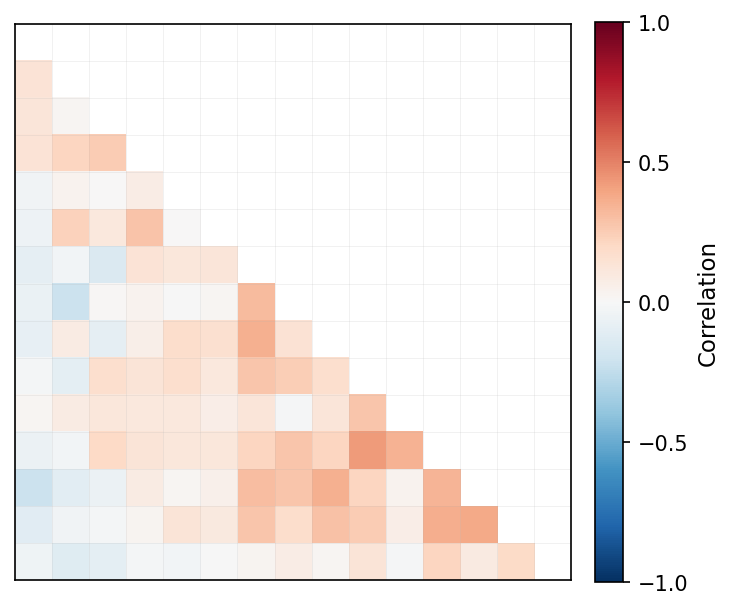

In [92]:
simtvae0 = tvae_sim_pdac_mrm_healthy_multi[0]
simtvae1 = tvae_sim_pdac_mrm_disease_multi[0]

simtvae0 = simtvae0.reindex(columns, axis=1)
plot_corr(simtvae0, size = 5)

(<Figure size 750x750 with 2 Axes>, <Axes: >)

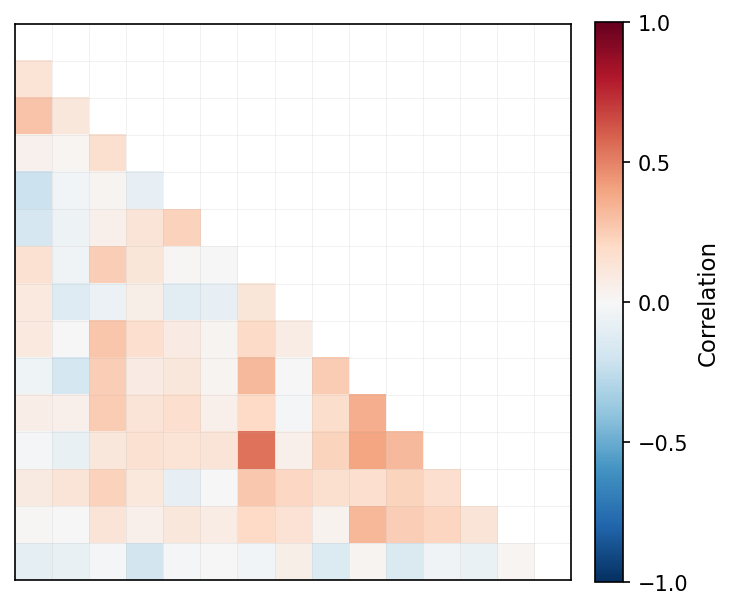

In [93]:
simtvae1 = simtvae1.reindex(columns, axis=1)
plot_corr(simtvae1, size = 5)

#### Copula

(<Figure size 750x750 with 2 Axes>, <Axes: >)

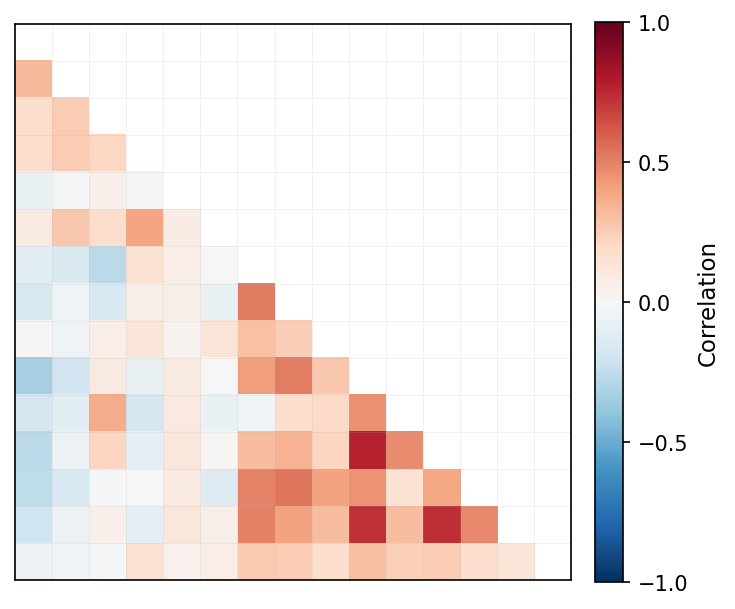

In [94]:
simco0 = copula_sim_pdac_mrm_healthy_multi[0]
simco1 = copula_sim_pdac_mrm_disease_multi[0]

simco0 = simco0.reindex(columns, axis=1)
plot_corr(simco0, size = 5)

(<Figure size 750x750 with 2 Axes>, <Axes: >)

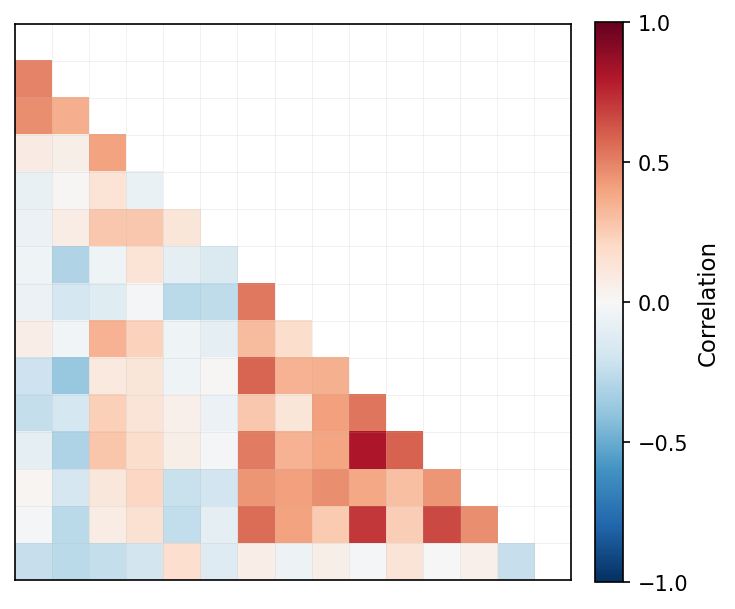

In [95]:
simco1 = simco1.reindex(columns, axis=1)
plot_corr(simco1, size = 5)

## Correlation statistics

In [26]:
pdac_mrm_input = pdac_mrm_input.drop(columns=['originalRUN'])

### Per-protein

In [27]:
pp_mrm_sim_scores = similarity_across_simulations(pprotein_sim_pdac_mrm_healthy_multi, 
                                              pprotein_sim_pdac_mrm_disease_multi, 
                                              pdac_mrm_input, "GROUP", "Normal", "Cancer")

Evaluating simulations:   0%|          | 0/100 [00:00<?, ?it/s]

IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.IPython not installed.

IPython not installed.
IPython not installed.
IPython not installed.
IPython not installed.


/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mean_val, inplace=True)
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace meth

In [29]:
pp_avg_scores = {key: round(np.mean(values),4) for key, values in pp_mrm_sim_scores.items()}
print(pp_avg_scores.values())

dict_values([0.9983, 0.0468, 0.9273, 0.9076, 0.72])


In [30]:
pp_avg_scores = {key: round(np.std(values),4) for key, values in pp_mrm_sim_scores.items()}
print(pp_avg_scores.values())

dict_values([0.0007, 0.0712, 0.0019, 0.0255, 0.0197])


### TVAE

In [31]:
tvae_mrm_sim_scores = similarity_across_simulations(tvae_sim_pdac_mrm_healthy_multi, 
                                                tvae_sim_pdac_mrm_disease_multi, 
                                                pdac_mrm_input, "GROUP", "Normal", "Cancer")

Evaluating simulations:   0%|          | 0/100 [00:00<?, ?it/s]/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mean_val, inplace=True)
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace me

In [32]:
tvae_avg_scores = {key: round(np.mean(values),4) for key, values in tvae_mrm_sim_scores.items()}
print(tvae_avg_scores.values())

dict_values([0.9831, 0.7841, 0.9292, 0.9234, 0.905])


In [33]:
tvae_avg_scores = {key: round(np.std(values),4) for key, values in tvae_mrm_sim_scores.items()}
print(tvae_avg_scores.values())

dict_values([0.0027, 0.0346, 0.0025, 0.0205, 0.0109])


### Copula

In [34]:
copula_mrm_sim_scores = similarity_across_simulations(copula_sim_pdac_mrm_healthy_multi, 
                                                      copula_sim_pdac_mrm_disease_multi, 
                                                      pdac_mrm_input, "GROUP", "Normal", "Cancer")

Evaluating simulations:   0%|          | 0/100 [00:00<?, ?it/s]/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mean_val, inplace=True)
/mnt/f/OneDrive - Northeastern University/Northeastern/Research/vartika_paper/MSquantSim/src/MSquantSim/similarity_scores.py:185: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace me

In [35]:
copula_avg_scores = {key: round(np.mean(values),4) for key, values in copula_mrm_sim_scores.items()}
print(copula_avg_scores.values())

dict_values([0.9941, 0.957, 0.9426, 0.9244, 0.9546])


In [36]:
copula_avg_scores = {key: round(np.std(values),4) for key, values in copula_mrm_sim_scores.items()}
print(copula_avg_scores.values())

dict_values([0.0033, 0.0087, 0.0063, 0.0199, 0.0059])


# Old stuff

#### Visual Metrics

#### Pairplot Experimental data

In [ ]:
sns.set_style("white")
sns.pairplot(data[['A0A0C4DH73', 'A0A0G2JPR0','A0A075B6Q5', 'A0A075B6S5','Condition']], hue="Condition",height=1.5, aspect=0.8)

#### Pairplot Per-protein data

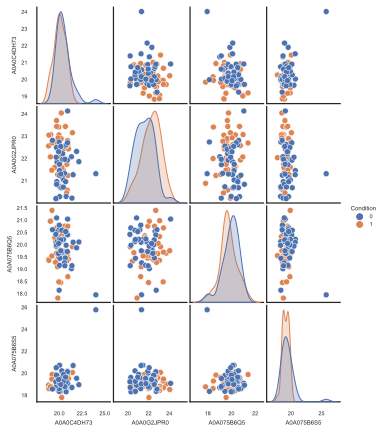

In [45]:
simpp0 = pd.read_csv('../casestudy/pdac/perprotein/pdac0_pp_0.csv')
simpp1 = pd.read_csv('../casestudy/pdac/perprotein/pdac1_pp_0.csv')
merged_df = pd.merge(simpp0, simpp1, how='outer', indicator=True)
merged_df['Condition'] = merged_df['_merge'].map({ 'left_only': 0, 'right_only': 1})
merged_df = merged_df.drop('_merge', axis=1)
sns.pairplot(data[['A0A0C4DH73', 'A0A0G2JPR0','A0A075B6Q5', 'A0A075B6S5','Condition']], hue="Condition",height=1.5, aspect=0.8)

#### Pairplot TVAE data

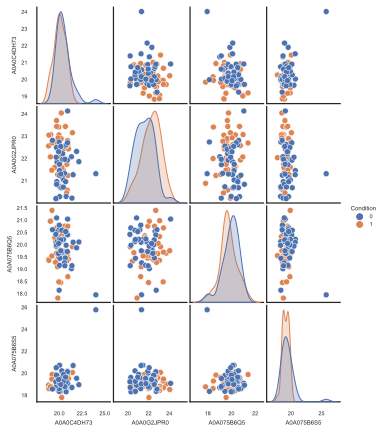

In [46]:
simtvae0 = pd.read_csv('../casestudy/pdac/tvae/pdac0_tvae_0.csv')
simtvae1 = pd.read_csv('../casestudy/pdac/tvae/pdac1_tvae_0.csv')
merged_df = pd.merge(simtvae0, simtvae1, how='outer', indicator=True)
merged_df['Condition'] = merged_df['_merge'].map({ 'left_only': 0, 'right_only': 1})
merged_df = merged_df.drop('_merge', axis=1)
sns.pairplot(data[['A0A0C4DH73', 'A0A0G2JPR0','A0A075B6Q5', 'A0A075B6S5','Condition']], hue="Condition",height=1.5, aspect=0.8)



#### Pairplot Copula data

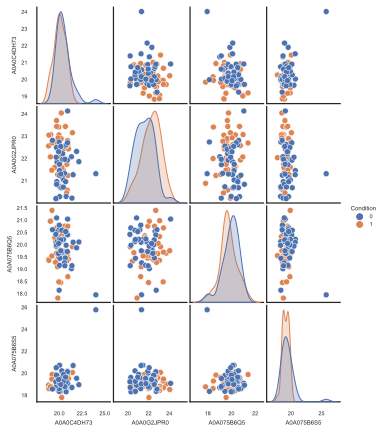

In [47]:
simco0 = pd.read_csv('../casestudy/pdac/copula/pdac0_gm_copula_0.csv')
simco1 = pd.read_csv('../casestudy/pdac/copula/pdac1_gm_copula_0.csv')
merged_df = pd.merge(simco0, simco1, how='outer', indicator=True)
merged_df['Condition'] = merged_df['_merge'].map({ 'left_only': 0, 'right_only': 1})
merged_df = merged_df.drop('_merge', axis=1)
sns.pairplot(data[['A0A0C4DH73', 'A0A0G2JPR0','A0A075B6Q5', 'A0A075B6S5','Condition']], hue="Condition",height=1.5, aspect=0.8)



#### Real correlation for Experimental healthy

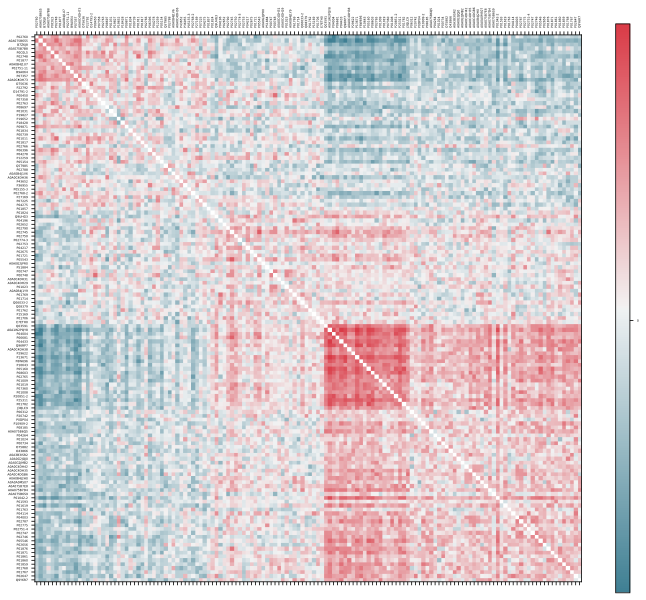

In [21]:
df = data
df_with_0 = df[df['Condition'] == 0].drop(columns='Condition')
df_with_1 = df[df['Condition'] == 1].drop(columns='Condition')
df = df_with_0
X = df.corr().values
X[np.isnan(X)]= 0
d = sch.distance.pdist(X)   
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [df.columns.tolist()[i] for i in list((np.argsort(ind)))]
df = df.reindex(columns, axis=1)
plot_corr(df, size=10,font_scale=0.5)


#### Correlation for Per-protein healthy

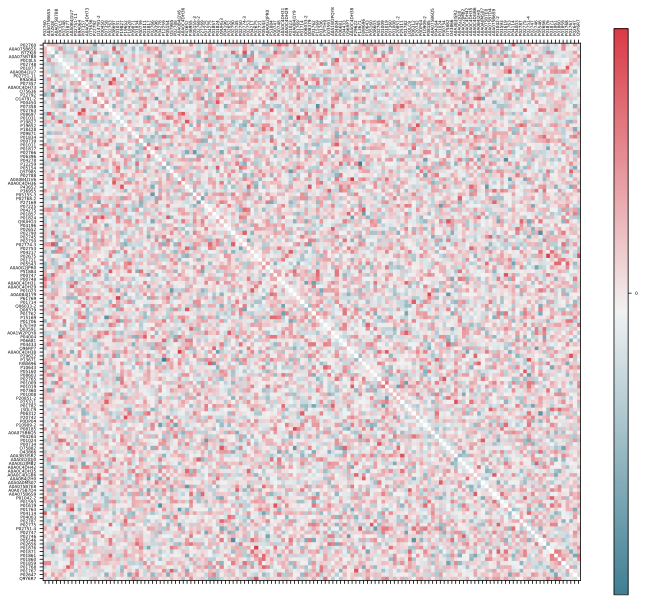

In [22]:
simpp0 = simpp0.reindex(columns, axis=1)
plot_corr(simpp0,size=10)

#### Correlation for TVAE healthy

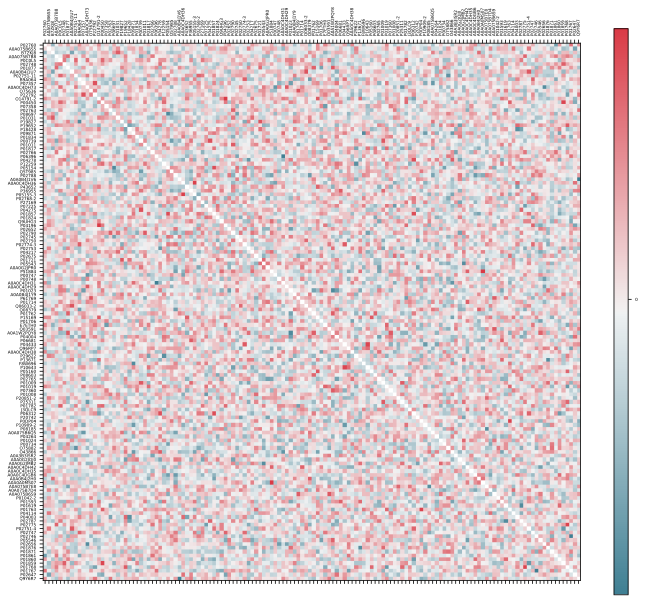

In [23]:
simtvae0 = simtvae0.reindex(columns, axis=1)
plot_corr(simtvae0,size=10)

#### Correlation for Copula healthy

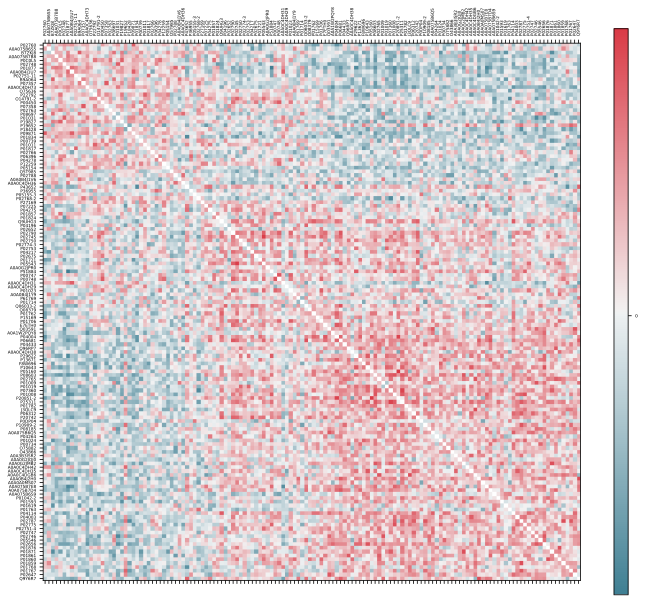

In [24]:
simco0 = simco0.reindex(columns, axis=1)
plot_corr(simco0,size=10)

#### Real correlation for Experimental PDAC

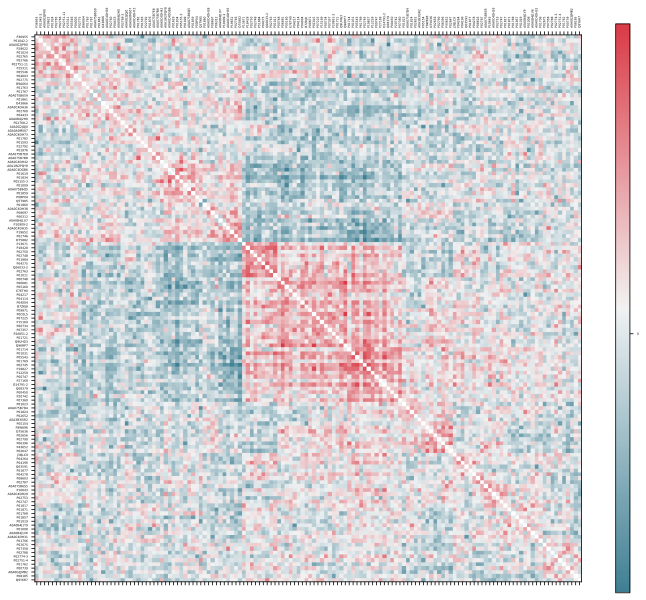

In [25]:
df = df_with_1
X = df.corr().values
X[np.isnan(X)]= 0
d = sch.distance.pdist(X)   
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [df.columns.tolist()[i] for i in list((np.argsort(ind)))]
df = df.reindex(columns, axis=1)
plot_corr(df, size=10,font_scale=0.5)

#### Correlation for Per-protein PDAC

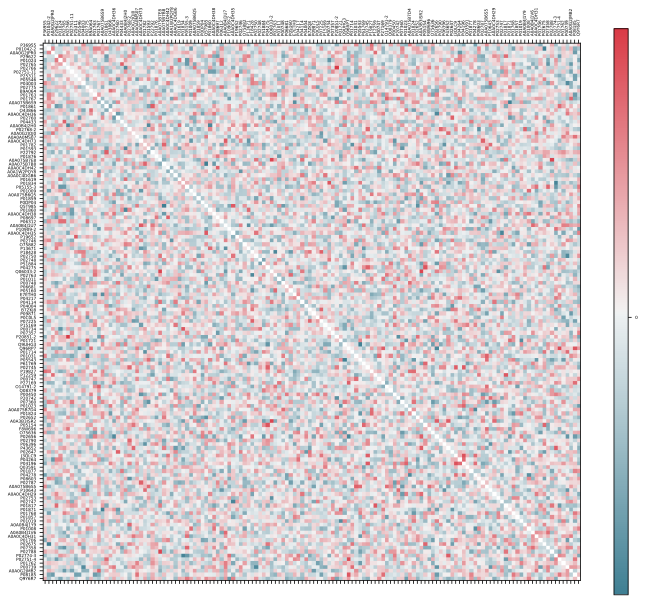

In [26]:
simpp1 = simpp1.reindex(columns, axis=1)
plot_corr(simpp1,size=10)

#### Correlation for TVAE PDAC

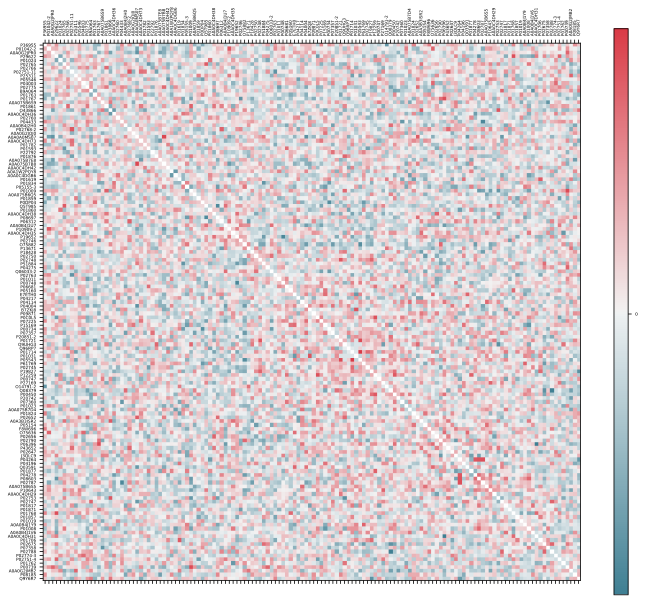

In [27]:
simtvae1 = simtvae1.reindex(columns, axis=1)
plot_corr(simtvae1,size=10)


#### Correlation for Copula PDAC

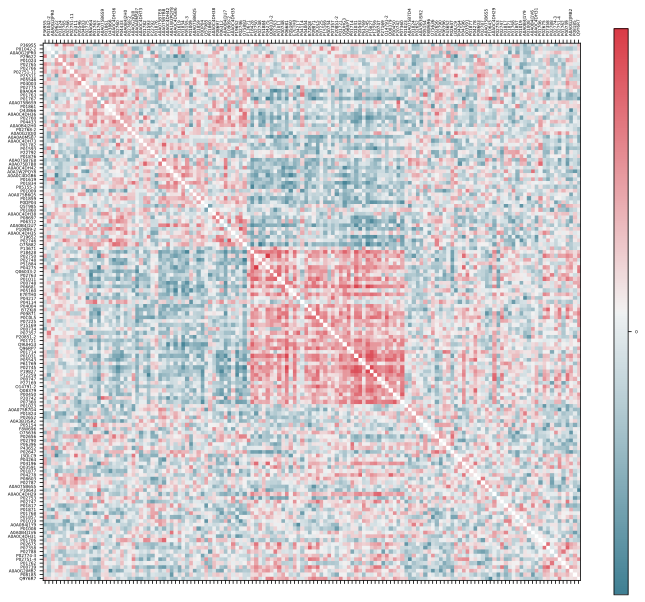

In [28]:
simco1 = simco1.reindex(columns, axis=1)
plot_corr(simco1,size=10)

## Planning. Use simulations to plan future experiments

#### Class Prediction

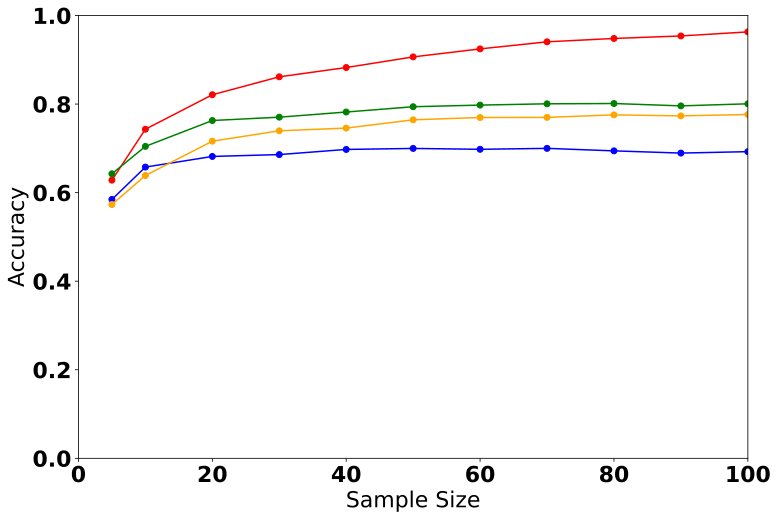

In [10]:
rfaccuracy = pd.read_csv('../casestudy/pdac/pdacdia/rfaccuracy.csv')
crc_data_val = rfaccuracy
# Plotting
# matplotlib.rcParams.update({'font.size': 22})
font = {'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

plt.figure(figsize=(12, 8))
# Plot REAL
plt.plot(crc_data_val['Sample Size'], crc_data_val['Accuracy'],label='Experimental',marker='o', color='red')
# plt.fill_between(crc_data_val['Sample Size'], crc_data_val['min'], crc_data_val['max'], color='red', alpha=0.3)


# Plot PP
plt.plot(crc_data_val['Sample Size'], crc_data_val['PP Accuracy'], label='PP',marker='o', color='blue')
# plt.fill_between(crc_data_val['Sample Size'], crc_data_val['PP min'], crc_data_val['PP max'], color='blue', alpha=0.3)

# Plot CO
plt.plot(crc_data_val['Sample Size'], crc_data_val['CO Accuracy'], label='CO',marker='o', color='orange')
# plt.fill_between(crc_data_val['Sample Size'], crc_data_val['CO min'], crc_data_val['CO max'], color='orange', alpha=0.3)


# Plot TVAE
plt.plot(crc_data_val['Sample Size'], crc_data_val['TVAE Accuracy'], label='TVAE',marker='o', color='green')
# plt.fill_between(crc_data_val['Sample Size'], crc_data_val['TVAE min'], crc_data_val['TVAE max'], color='green', alpha=0.3)

# Labels and legend
plt.xlabel('Sample Size')
plt.ylabel('Accuracy')
# plt.title('Accuracy vs Sample Size for Different Methods')
# plt.legend()
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# Show plot
# plt.grid(True)
plt.ylim(0.0, 1.0)
plt.xlim(0,100)
plt.show()

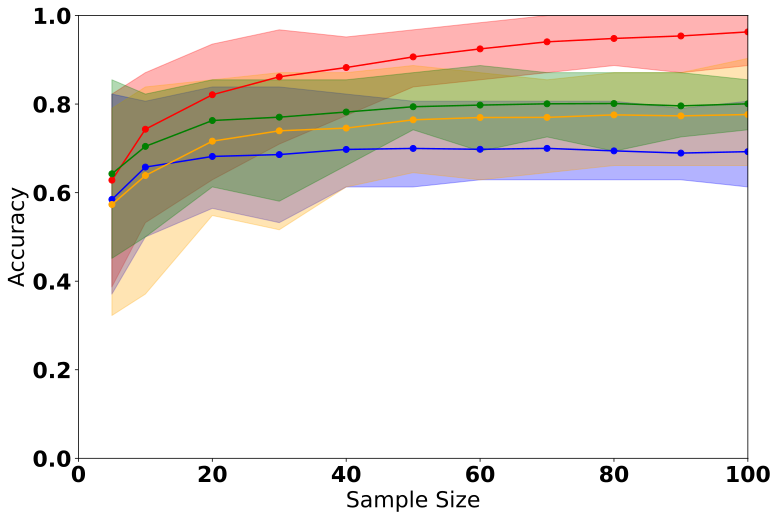

In [11]:
rfaccuracy = pd.read_csv('../casestudy/pdac/pdacdia/rfaccuracy.csv')
crc_data_val = rfaccuracy
# Plotting
# matplotlib.rcParams.update({'font.size': 22})
font = {'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

plt.figure(figsize=(12, 8))
# Plot REAL
plt.plot(crc_data_val['Sample Size'], crc_data_val['Accuracy'],label='Experimental',marker='o', color='red')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['min'], crc_data_val['max'], color='red', alpha=0.3)


# Plot PP
plt.plot(crc_data_val['Sample Size'], crc_data_val['PP Accuracy'], label='PP',marker='o', color='blue')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['PP min'], crc_data_val['PP max'], color='blue', alpha=0.3)

# Plot CO
plt.plot(crc_data_val['Sample Size'], crc_data_val['CO Accuracy'], label='CO',marker='o', color='orange')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['CO min'], crc_data_val['CO max'], color='orange', alpha=0.3)


# Plot TVAE
plt.plot(crc_data_val['Sample Size'], crc_data_val['TVAE Accuracy'], label='TVAE',marker='o', color='green')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['TVAE min'], crc_data_val['TVAE max'], color='green', alpha=0.3)

# Labels and legend
plt.xlabel('Sample Size')
plt.ylabel('Accuracy')
# plt.title('Accuracy vs Sample Size for Different Methods')
# plt.legend()
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# Show plot
# plt.grid(True)
plt.ylim(0.0, 1.0)
plt.xlim(0,100)
plt.show()

##### Class Discovery

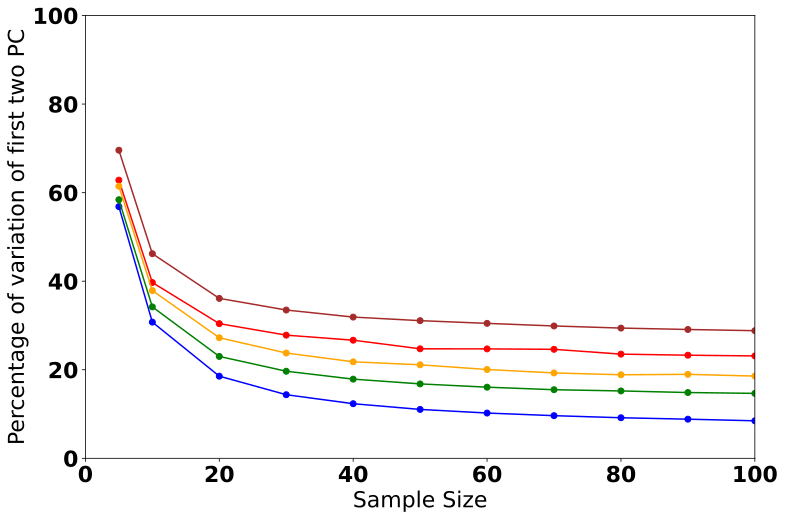

In [19]:
pcaaccuracy = pd.read_csv('../casestudy/pdac/pcanew.csv')
crc_data_val = pcaaccuracy

# Plotting
# matplotlib.rcParams.update({'font.size': 22})
font = {'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

plt.figure(figsize=(12, 8))
# Plot REAL
plt.plot(crc_data_val['Sample Size'], crc_data_val['Accuracy'],label='Experimental',marker='o', color='red')
# plt.fill_between(crc_data_val['Sample Size'], crc_data_val['min'], crc_data_val['max'], color='red', alpha=0.3)

plt.plot(crc_data_val['Sample Size'], crc_data_val['Accuracy v'],label='Experimental Validation',marker='o', color='brown')
# plt.fill_between(crc_data_val['Sample Size'], crc_data_val['min v'], crc_data_val['max v'], color='brown', alpha=0.3)


# Plot PP
plt.plot(crc_data_val['Sample Size'], crc_data_val['PP Accuracy'], label='PP',marker='o', color='blue')
# plt.fill_between(crc_data_val['Sample Size'], crc_data_val['PP min'], crc_data_val['PP max'], color='blue', alpha=0.3)

# Plot CO
plt.plot(crc_data_val['Sample Size'], crc_data_val['CO Accuracy'], label='CO',marker='o', color='orange')
# plt.fill_between(crc_data_val['Sample Size'], crc_data_val['CO min'], crc_data_val['CO max'], color='orange', alpha=0.3)


# Plot TVAE
plt.plot(crc_data_val['Sample Size'], crc_data_val['TVAE Accuracy'], label='TVAE',marker='o', color='green')
# plt.fill_between(crc_data_val['Sample Size'], crc_data_val['TVAE min'], crc_data_val['TVAE max'], color='green', alpha=0.3)

# Labels and legend
plt.xlabel('Sample Size')
plt.ylabel('Percentage of variation of first two PC')
# plt.title('Accuracy vs Sample Size for Different Methods')
# plt.legend()
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# Show plot
# plt.grid(True)
plt.ylim(0, 100)
plt.xlim(0,100)
plt.show()


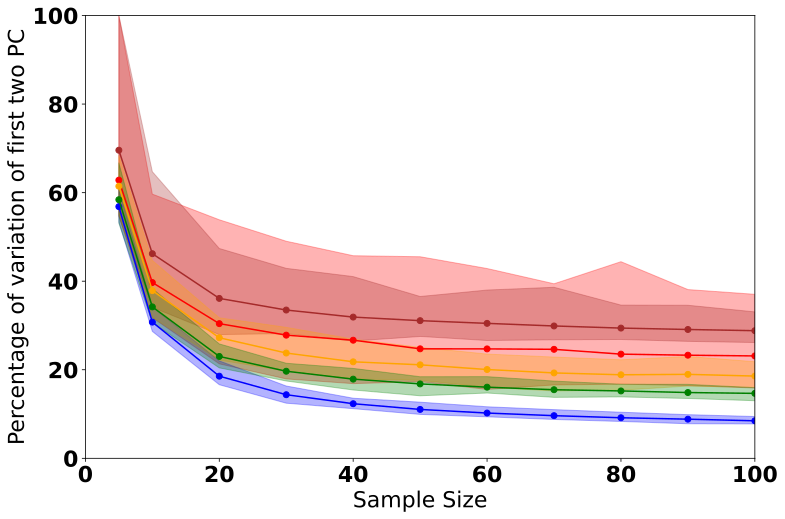

In [20]:
pcaaccuracy = pd.read_csv('../casestudy/pdac/pcanew.csv')
crc_data_val = pcaaccuracy

# Plotting
# matplotlib.rcParams.update({'font.size': 22})
font = {'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

plt.figure(figsize=(12, 8))
# Plot REAL
plt.plot(crc_data_val['Sample Size'], crc_data_val['Accuracy'],label='Experimental',marker='o', color='red')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['min'], crc_data_val['max'], color='red', alpha=0.3)

plt.plot(crc_data_val['Sample Size'], crc_data_val['Accuracy v'],label='Experimental Validation',marker='o', color='brown')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['min v'], crc_data_val['max v'], color='brown', alpha=0.3)


# Plot PP
plt.plot(crc_data_val['Sample Size'], crc_data_val['PP Accuracy'], label='PP',marker='o', color='blue')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['PP min'], crc_data_val['PP max'], color='blue', alpha=0.3)

# Plot CO
plt.plot(crc_data_val['Sample Size'], crc_data_val['CO Accuracy'], label='CO',marker='o', color='orange')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['CO min'], crc_data_val['CO max'], color='orange', alpha=0.3)


# Plot TVAE
plt.plot(crc_data_val['Sample Size'], crc_data_val['TVAE Accuracy'], label='TVAE',marker='o', color='green')
plt.fill_between(crc_data_val['Sample Size'], crc_data_val['TVAE min'], crc_data_val['TVAE max'], color='green', alpha=0.3)

# Labels and legend
plt.xlabel('Sample Size')
plt.ylabel('Percentage of variation of first two PC')
# plt.title('Accuracy vs Sample Size for Different Methods')
# plt.legend()
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# Show plot
# plt.grid(True)
plt.ylim(0, 100)
plt.xlim(0,100)
plt.show()


##### Class Comparison

In [23]:
adjusted_p_values = {}
adjusted_p_values_pp = {}
adjusted_p_values_co = {}
adjusted_p_values_tvae = {}
dicts = {'real_adjust': adjusted_p_values, 'pp_adjust': adjusted_p_values_pp, 'co_adjust': adjusted_p_values_co, 'tvae_adjust': adjusted_p_values_tvae}  # Add more dictionaries as needed

# Load each JSON file and update the corresponding dictionary
for key, value in dicts.items():
    file_path = f'../casestudy/pdac/pval/{key}.json'
    with open(file_path, 'r') as json_file:
        value.update(json.load(json_file))
sample_sizes=[5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]
real = []
pp = []
co = []
tvae = []
realmin = []
realmax = []
ppmin = []
ppmax = []
comin = []
comax = []
tvaemin = []
tvaemax = []

col = 'A0A0C4DH73'

for s in sample_sizes:
    s = str(s)
    real.append(np.median(adjusted_p_values[s][col]))
    pp.append(np.median(adjusted_p_values_pp[s][col]))
    co.append(np.median(adjusted_p_values_co[s][col]))
    tvae.append(np.median(adjusted_p_values_tvae[s][col]))
    realmin.append(np.min(adjusted_p_values[s][col]))
    realmax.append(np.max(adjusted_p_values[s][col]))
    ppmin.append(np.min(adjusted_p_values_pp[s][col]))
    ppmax.append(np.max(adjusted_p_values_pp[s][col]))
    comin.append(np.min(adjusted_p_values_co[s][col]))
    comax.append(np.max(adjusted_p_values_co[s][col])) 
    tvaemin.append(np.min(adjusted_p_values_tvae[s][col]))
    tvaemax.append(np.max(adjusted_p_values_tvae[s][col]))

  


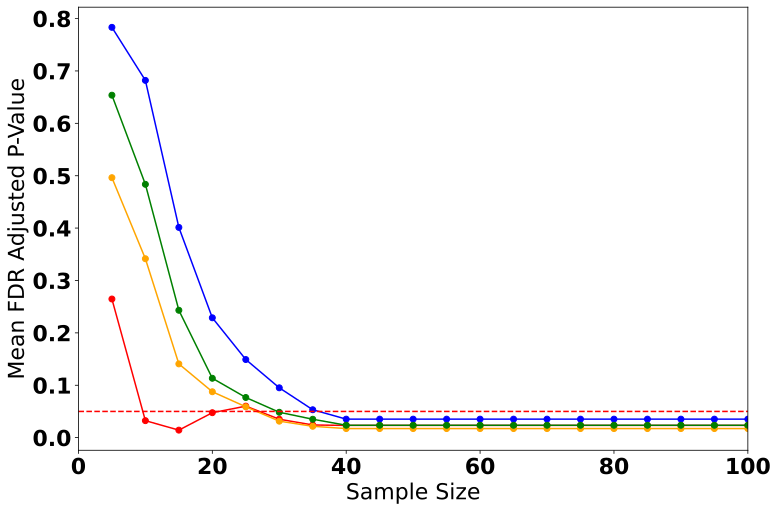

In [25]:
# Plot mean p-value vs sample size for each column
plt.figure(figsize=(12, 8))
font = {'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

plt.plot(sample_sizes, real, marker='o', label='Experimental', color='red', linestyle='-')
# plt.fill_between(sample_sizes, realmin, realmax, color='red', alpha=0.3)

plt.plot(sample_sizes, pp, marker='o', label='Per-Protein', color='blue', linestyle='-')
# plt.fill_between(sample_sizes, ppmin, ppmax, color='blue', alpha=0.3)

plt.plot(sample_sizes, co, marker='o', label='Copula', color='orange', linestyle='-')
# plt.fill_between(sample_sizes, comin, comax, color='orange', alpha=0.3)

plt.plot(sample_sizes, tvae, marker='o', label='TVAE', color='green', linestyle='-')
# plt.fill_between(sample_sizes, tvaemin, tvaemax, color='green', alpha=0.3)

plt.axhline(y=0.05, color='red', linestyle='--')
plt.xlabel('Sample Size')
plt.ylabel('Mean FDR Adjusted P-Value')

plt.xlim(0,100)
plt.show()

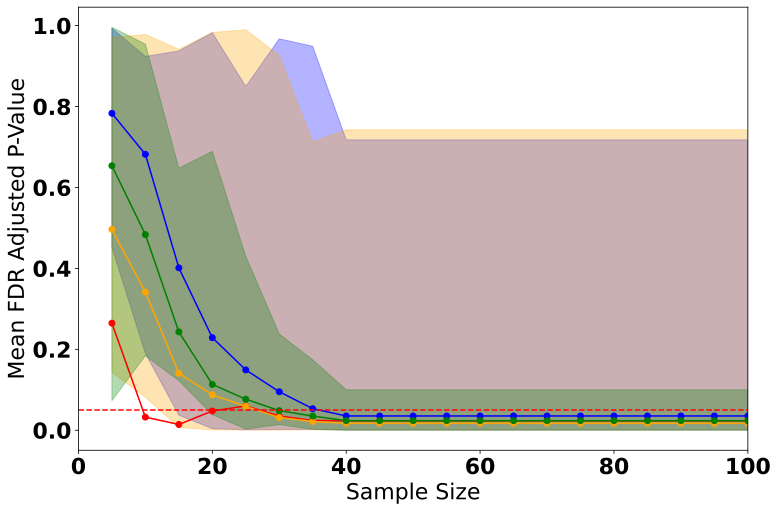

In [24]:

# Plot mean p-value vs sample size for each column
plt.figure(figsize=(12, 8))
font = {'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

plt.plot(sample_sizes, real, marker='o', label='Experimental', color='red', linestyle='-')
plt.fill_between(sample_sizes, realmin, realmax, color='red', alpha=0.3)

plt.plot(sample_sizes, pp, marker='o', label='Per-Protein', color='blue', linestyle='-')
plt.fill_between(sample_sizes, ppmin, ppmax, color='blue', alpha=0.3)

plt.plot(sample_sizes, co, marker='o', label='Copula', color='orange', linestyle='-')
plt.fill_between(sample_sizes, comin, comax, color='orange', alpha=0.3)

plt.plot(sample_sizes, tvae, marker='o', label='TVAE', color='green', linestyle='-')
plt.fill_between(sample_sizes, tvaemin, tvaemax, color='green', alpha=0.3)

plt.axhline(y=0.05, color='red', linestyle='--')
plt.xlabel('Sample Size')
plt.ylabel('Mean FDR Adjusted P-Value')

plt.xlim(0,100)
plt.show()